<a href="https://colab.research.google.com/github/shrmtmt/manim_KotanisAnt/blob/main/manim_Kotanis_ant.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [45]:
%%time
!sudo apt update
!sudo apt install libcairo2-dev ffmpeg \
    texlive texlive-latex-extra texlive-fonts-extra \
    texlive-latex-recommended texlive-science \
    tipa libpango1.0-dev
!pip install manim
!pip install IPython --upgrade

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 229 kB in 2s (118 kB/s)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
39 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependenc

In [74]:
from manim import *
import numpy as np
import math

In [225]:
class KotaniAnt(ThreeDScene):
    def construct(self):
        # 上面の正方形を2つ作成
        square11 = Square(side_length=1.0, color=WHITE).shift(UR*.5).shift(OUT*2)
        square12 = Square(side_length=1.0, color=WHITE).shift(UR*.5).shift(OUT*2)

        # 左側の正方形を2つ作成
        square21 = Square(side_length=1.0, color=WHITE).shift(RIGHT*.5).shift(UP*0.).shift(OUT*.5).rotate(PI/2, RIGHT)
        square22 = Square(side_length=1.0, color=WHITE).shift(RIGHT*.5).shift(UP*0.).shift(OUT*1.5).rotate(PI/2, RIGHT)

        # 右側の正方形を2つ作成
        square31 = Square(side_length=1.0, color=WHITE).shift(RIGHT*1.).shift(UP*.5).shift(OUT*.5).rotate(PI/2, UP)
        square32 = Square(side_length=1.0, color=WHITE).shift(RIGHT*1.).shift(UP*.5).shift(OUT*1.5).rotate(PI/2, UP)

        # 正方形をグループ化
        squares = VGroup(square11, square12, square21, square22, square31, square32)

        # シーンに正方形を追加
        self.add(squares)

        # カメラの視点を設定
        camera_phi = 60 * DEGREES
        camera_theta = -30 * DEGREES
        self.set_camera_orientation(phi=camera_phi, theta=camera_theta, frame_center=squares.get_center(), zoom=2)

        # 上面を側面に展開させるアニメーション
        self.play(
            Rotate(
                square11,
                angle=PI*.5,
                about_point=square11.get_bottom(),
                axis=RIGHT
            ),
            Rotate(
                square12,
                angle=PI*.5,
                about_point=square12.get_right(),
                axis=UP
            ))

        # 右側の正方形を左側の正方形と同一平面に展開させるアニメーション
        self.play(
            Rotate(
                square31,
                angle=PI*.5,
                about_point=square31.get_bottom(),
                axis=IN
            ),
            Rotate(
                square32,
                angle=PI*.5,
                about_point=square32.get_bottom(),
                axis=IN
            ),
            Rotate(
                square12,
                angle=PI*.5,
                about_point=square12.get_bottom(),
                axis=IN
            ))

        # カメラのアニメーション
        self.move_camera(phi=90 * DEGREES, theta=-90 * DEGREES, frame_center=squares.get_center())

        # 半径
        radius = 2 * math.sqrt(2)

        # 円弧のパラメトリック関数を定義
        def arc_function(t):
            theta = interpolate(math.pi/4, math.pi/2, t)
            return np.array([
                radius * math.cos(theta),
                0,
                radius * math.sin(theta)
            ])

        # 円弧を作成
        arc0 = ParametricFunction(arc_function, t_range=[0, 1], color=WHITE)
        arc1 = ParametricFunction(arc_function, t_range=[0.54, 1], color=WHITE)
        arc2 = ParametricFunction(arc_function, t_range=[0, 0.54], color=WHITE)

        # 半径を示す線分を作成
        radius_line = Line(start=ORIGIN, end=arc0.get_start(), color=RED)

        # 半径の長さを示すテキストを作成
        radius_text = MathTex(r"2\sqrt{2}").rotate(PI / 2, axis=RIGHT).set_color(RED)
        radius_text.next_to(radius_line.get_center(), DOWN, buff=0.1)

        # 線分とテキストを円弧に沿って動かすためのアップデート関数
        def update_radius_line_and_text(mob):
            new_end = arc0.get_end()
            radius_line.put_start_and_end_on(ORIGIN, new_end)
            radius_text.next_to(radius_line.get_center(), DOWN, buff=0.1)

        # 半径線とテキストをフェードイン
        self.play(FadeIn(radius_line), FadeIn(radius_text))

        # 円弧と半径線、テキストのアニメーションを同時に実行
        self.play(
            Create(arc0),
            UpdateFromFunc(radius_line, update_radius_line_and_text),
            UpdateFromFunc(radius_text, update_radius_line_and_text),
            rate_func=linear
        )

        # 半径線とテキストをフェードアウト
        self.play(
            FadeOut(radius_line),
            FadeOut(radius_text),
            FadeOut(arc0),
            FadeIn(arc1),
            FadeIn(arc2)
            )

        square11s = VGroup(square11, arc1)
        square12s = VGroup(square12, arc2)

        # カメラを元の位置に
        # self.move_camera(phi=60 * DEGREES, theta=-30 * DEGREES, frame_center=squares.get_center())
        self.move_camera(phi=camera_phi, theta=camera_theta, frame_center=squares.get_center())

        # 右側の正方形を折り込む
        self.play(
            Rotate(
                square31,
                angle=PI*.5,
                about_point=square31.get_left(),
                axis=OUT
            ),
            Rotate(
                square32,
                angle=PI*.5,
                about_point=square32.get_left(),
                axis=OUT
            ),
            Rotate(
                square12s,
                angle=PI*.5,
                about_point=square12.get_left(),
                axis=OUT
            ))

        # 上面の正方形2つを折り込む
        self.play(
            Rotate(
                square11s,
                angle=-PI*.5,
                about_point=np.array([0, 0, 2]),
                axis=RIGHT
            ),
            Rotate(
                square12s,
                angle=-PI*.5,
                about_point=np.array([1, 0, 2]),
                axis=UP
            ))

        self.wait(1)

        phi, theta, focal_distance, gamma, distance_to_origin = self.camera.get_value_trackers()

        self.play(
            FadeOut(square21),
            FadeOut(square22),
            FadeOut(square31),
            FadeOut(square32),
            phi.animate.set_value(0*DEGREES),
            theta.animate.set_value(-90*DEGREES)
        )

        # ズームイン
        self.move_camera(frame_center=square11.get_center(), zoom=4)

        # 円弧オブジェクトを複製
        arc1_copy = arc1.copy()
        arc2_copy = arc2.copy()

        # 複製オブジェクトをシーンに追加
        self.add(arc1_copy, arc2_copy)

        # 回転軸を定義 (0,0,0) と (1,1,0) を通る
        rotation_axis = np.array([1, 1, 0])
        arcs_copy = VGroup(arc1_copy, arc2_copy, square12)

        # 立方体を特定の軸を中心に回転
        self.play(Rotate(arcs_copy, angle=PI, axis=rotation_axis))

        arcs = VGroup(arc1, arc2, arc1_copy, arc2_copy)

        filled_arcs = arcs.copy().set_stroke(width=0).set_fill(GRAY_B, opacity=1)
        # filled_arcs = arcs.copy().set_stroke(GRAY_B, opacity=1).set_fill(GRAY_B, opacity=1)

        vertices1 = [np.array([0, 1, 2]), np.array([1, 1, 2]), np.array([0, 3-math.sqrt(7)-.01, 2])]
        vertices2 = [np.array([1, 0, 2]), np.array([1, 1, 2]), np.array([3-math.sqrt(7)-.01, 0, 2])]
        vertices3 = [np.array([0, 0, 2]), np.array([1, 0, 2]), np.array([1, math.sqrt(7)-2, 2]), np.array([0, math.sqrt(8)-2, 2])]
        vertices4 = [np.array([0, 0, 2]), np.array([0, 1, 2]), np.array([math.sqrt(7)-2, 1, 2]), np.array([math.sqrt(8)-2, 0, 2])]

        # 多角形を作成し、塗りつぶしを設定
        polygon1 = Polygon(*vertices1, fill_color=GRAY_B, fill_opacity=1, stroke_width=0, stroke_color=GRAY_B)
        polygon2 = Polygon(*vertices2, fill_color=GRAY_B, fill_opacity=1, stroke_width=0, stroke_color=GRAY_B)
        polygon3 = Polygon(*vertices3, fill_color=GRAY_B, fill_opacity=1, stroke_width=0, stroke_color=GRAY_B)
        polygon4 = Polygon(*vertices4, fill_color=GRAY_B, fill_opacity=1, stroke_width=0, stroke_color=GRAY_B)

        self.play(
            FadeOut(arcs),
            FadeIn(filled_arcs),
            FadeIn(polygon1),
            FadeIn(polygon2),
            FadeIn(polygon3),
            FadeIn(polygon4)
            )

        self.wait(2)


In [226]:
%%manim -qh -v WARNING KotaniAnt

[12/19/23 14:16:14] INFO     Animation 0 : Using cached data (hash :                           ]8;id=929025;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=674119;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py#78\78]8;;\
                             2171918674_1531074106_3461026392)                                                     

INFO:manim:Animation 0 : Using cached data (hash : 2171918674_1531074106_3461026392)


                    INFO     Animation 1 : Using cached data (hash :                           ]8;id=516743;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=499850;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py#78\78]8;;\
                             2314091943_1543591875_1925837805)                                                     

INFO:manim:Animation 1 : Using cached data (hash : 2314091943_1543591875_1925837805)


                    INFO     Animation 2 : Using cached data (hash :                           ]8;id=350137;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=940113;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py#78\78]8;;\
                             1754878230_395421475_1971256401)                                                      

INFO:manim:Animation 2 : Using cached data (hash : 1754878230_395421475_1971256401)


[12/19/23 14:16:19] INFO     Animation 3 : Partial movie file written in                   ]8;id=443993;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=665199;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/1793794801_1484452359_1050500137.mp4'                                         

INFO:manim:Animation 3 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/1793794801_1484452359_1050500137.mp4'


[12/19/23 14:16:24] INFO     Animation 4 : Partial movie file written in                   ]8;id=42387;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=278649;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/1793794801_3727977084_1589547973.mp4'                                         

INFO:manim:Animation 4 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/1793794801_3727977084_1589547973.mp4'


                    INFO     Animation 5 : Using cached data (hash :                           ]8;id=557671;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=460570;file:///usr/local/lib/python3.10/dist-packages/manim/renderer/cairo_renderer.py#78\78]8;;\
                             1793794801_3498838126_3203054603)                                                     

INFO:manim:Animation 5 : Using cached data (hash : 1793794801_3498838126_3203054603)


[12/19/23 14:16:28] INFO     Animation 6 : Partial movie file written in                   ]8;id=517080;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=813621;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/2833918009_3959215979_4188653322.mp4'                                         

INFO:manim:Animation 6 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/2833918009_3959215979_4188653322.mp4'


[12/19/23 14:16:31] INFO     Animation 7 : Partial movie file written in                   ]8;id=929022;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=961758;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/208262656_2552823982_3045060123.mp4'                                          

INFO:manim:Animation 7 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/208262656_2552823982_3045060123.mp4'


[12/19/23 14:16:35] INFO     Animation 8 : Partial movie file written in                   ]8;id=152819;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=550058;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/2013294391_3416543882_2808830935.mp4'                                         

INFO:manim:Animation 8 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/2013294391_3416543882_2808830935.mp4'


[12/19/23 14:16:38] INFO     Animation 9 : Partial movie file written in                   ]8;id=921669;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=141447;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/2013294391_4205520711_1068850607.mp4'                                         

INFO:manim:Animation 9 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/2013294391_4205520711_1068850607.mp4'


[12/19/23 14:16:42] INFO     Animation 10 : Partial movie file written in                  ]8;id=752218;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=201702;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/4016114190_3499746983_3943392106.mp4'                                         

INFO:manim:Animation 10 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/4016114190_3499746983_3943392106.mp4'


[12/19/23 14:16:45] INFO     Animation 11 : Partial movie file written in                  ]8;id=506079;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=243257;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/3697202660_1353293086_1404282663.mp4'                                         

INFO:manim:Animation 11 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/3697202660_1353293086_1404282663.mp4'


[12/19/23 14:16:48] INFO     Animation 12 : Partial movie file written in                  ]8;id=571660;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=995026;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/3027644769_1798241778_2887641414.mp4'                                         

INFO:manim:Animation 12 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/3027644769_1798241778_2887641414.mp4'


[12/19/23 14:16:54] INFO     Animation 13 : Partial movie file written in                  ]8;id=344088;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=845613;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/3027644769_3346640817_2633228024.mp4'                                         

INFO:manim:Animation 13 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/3027644769_3346640817_2633228024.mp4'


[12/19/23 14:16:58] INFO     Animation 14 : Partial movie file written in                  ]8;id=480459;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=220025;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#527\527]8;;\
                             '/content/media/videos/content/1080p60/partial_movie_files/Ko                         
                             taniAnt/3027644769_66111383_1762121971.mp4'                                           

INFO:manim:Animation 14 : Partial movie file written in '/content/media/videos/content/1080p60/partial_movie_files/KotaniAnt/3027644769_66111383_1762121971.mp4'


                    INFO     Combining to Movie file.                                      ]8;id=501442;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=354439;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#617\617]8;;\

INFO:manim:Combining to Movie file.


[12/19/23 14:17:35] INFO                                                                   ]8;id=676935;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=517248;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene_file_writer.py#735\735]8;;\
                             File ready at                                                                         
                             '/content/media/videos/content/1080p60/KotaniAnt_ManimCE_v0.1                         
                             8.0.gif'                                                                              
                                                                                                                   

INFO:manim:
File ready at '/content/media/videos/content/1080p60/KotaniAnt_ManimCE_v0.18.0.gif'



                    INFO     Rendered KotaniAnt                                                        ]8;id=132940;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene.py\scene.py]8;;\:]8;id=206025;file:///usr/local/lib/python3.10/dist-packages/manim/scene/scene.py#241\241]8;;\
                             Played 15 animations                                                                  

INFO:manim:Rendered KotaniAnt
Played 15 animations


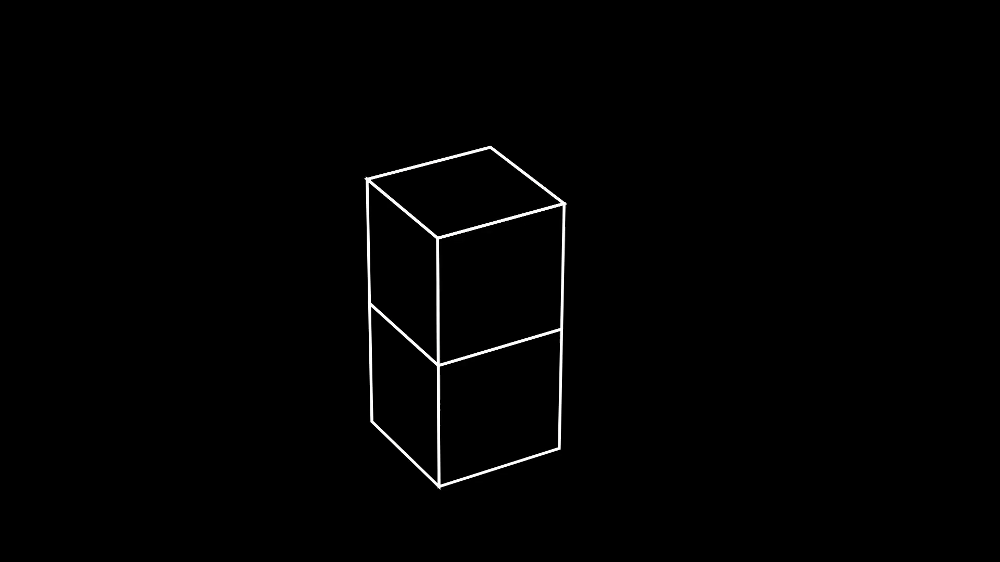

In [224]:
%%manim -qh --format gif KotaniAnt


In [ ]:
# 3次元空間における方向定数:
# RIGHT: RIGHT は水平方向の右を指し、X軸の正の方向を意味します。
# LEFT : LEFT はRIGHTの反対方向で、水平方向の左を指します。X軸の負の方向に相当します。
# IN   : IN は3次元空間において視聴者から遠ざかる方向、すなわち画面奥への方向を指します。これはY軸の正の方向です。
# OUT  : OUT はINの反対方向で、視聴者に近づく方向、または画面手前への方向を指します。Y軸の負の方向に相当します。
# UP   : UP は3次元空間における垂直方向の上を指します。通常、これはZ軸の正の方向を意味します。
# DOWN : DOWN はUPの反対方向で、垂直方向の下を指します。Z軸の負の方向に相当します。
